# Title

Deep Fake Image and Video Detection using CNN's and RNN's

# Problem Statement

DeepFake is composed from Deep Learning and Fake and means taking one person from an image or video and replacing with someone else likeness using technology such as Deep Artificial Neural Networks. Large companies like Google invest very much in fighting the DeepFake, this including release of large datasets to help training models to counter this threat.The phenomen invades rapidly the film industry and threatens to compromise news agencies. Large digital companies, including content providers and social platforms are in the frontrun of fighting Deep Fakes. GANs that generate DeepFakes becomes better every day and, of course, if you include in a new GAN model all the information we collected until now how to combat various existent models, we create a model that cannot be beatten by the existing ones.

First we will work on detecting faces that were forged and we will work on developing a model to detect videos.

# DeepFake Image detection

## About the Dataset

This dataset contains faces extracted from deepfake-detection-challenge. All images were of size 224x224. 

Due to memory issue we will only use a sample of the entire dataset for prediction.

## Importing Required libraries

In [1]:
!pip install -U --upgrade tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 72.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 86.1 MB/s eta 0:00:00:00:01
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.1
    Uninstalling tensorboard-2.15.1:
      Successfully uninstalled tensorboard-2.15.1
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.15.0
    Uninstalling tensorflow-2.15.0:
      Successfully uninstalled tensorflow-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is n

In [2]:
import sys
import sklearn
import tensorflow as tf

import cv2
import pandas as pd
import numpy as np

import plotly.graph_objs as go
from plotly.offline import iplot
from matplotlib import pyplot as plt

In [3]:
tf.test.is_gpu_available()

True

In [5]:
tf.__version__

'2.16.1'

In [6]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Data Visualisation

In [7]:
#You will need to download deep-faces dataset
import os

def get_data():
    return pd.read_csv('../input/deepfake-faces/metadata.csv')

In [8]:
meta=get_data()
meta.head()

,videoname,original_width,original_height,label,original
0,aznyksihgl.mp4,129,129,FAKE,xnojggkrxt.mp4
1,gkwmalrvcj.mp4,129,129,FAKE,hqqmtxvbjj.mp4
2,lxnqzocgaq.mp4,223,217,FAKE,xjzkfqddyk.mp4
3,itsbtrrelv.mp4,186,186,FAKE,kqvepwqxfe.mp4
4,ddvgrczjno.mp4,155,155,FAKE,pluadmqqta.mp4


In [9]:
meta.shape

(95634, 5)

In [10]:
len(meta[meta.label=='FAKE']),len(meta[meta.label=='REAL'])

(79341, 16293)

In [12]:
real_df = meta[meta["label"] == "REAL"]
fake_df = meta[meta["label"] == "FAKE"]
sample_size = 8000

real_df = real_df.sample(sample_size, random_state=42)
fake_df = fake_df.sample(sample_size, random_state=42)

sample_meta = pd.concat([real_df, fake_df])

As mentioned instead of using 95k images we will only use 16000 images.

In [13]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(sample_meta,test_size=0.2,random_state=42,stratify=sample_meta['label'])
Train_set, Val_set  = train_test_split(Train_set,test_size=0.3,random_state=42,stratify=Train_set['label'])

In [14]:
Train_set.shape,Val_set.shape,Test_set.shape

((8960, 5), (3840, 5), (3200, 5))

In [15]:
y = dict()

y[0] = []
y[1] = []

for set_name in (np.array(Train_set['label']), np.array(Val_set['label']), np.array(Test_set['label'])):
    y[0].append(np.sum(set_name == 'REAL'))
    y[1].append(np.sum(set_name == 'FAKE'))

trace0 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[0],
    name='REAL',
    marker=dict(color='#33cc33'),
    opacity=0.7
)
trace1 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[1],
    name='FAKE',
    marker=dict(color='#ff3300'),
    opacity=0.7
)

data = [trace0, trace1]
layout = go.Layout(
    title='Count of classes in each set',
    xaxis={'title': 'Set'},
    yaxis={'title': 'Count'}
)

fig = go.Figure(data, layout)
iplot(fig)

The original image dataset were biased with more fake images than real since we are taking a sample of it its better to take equal proportion of real and fake images.

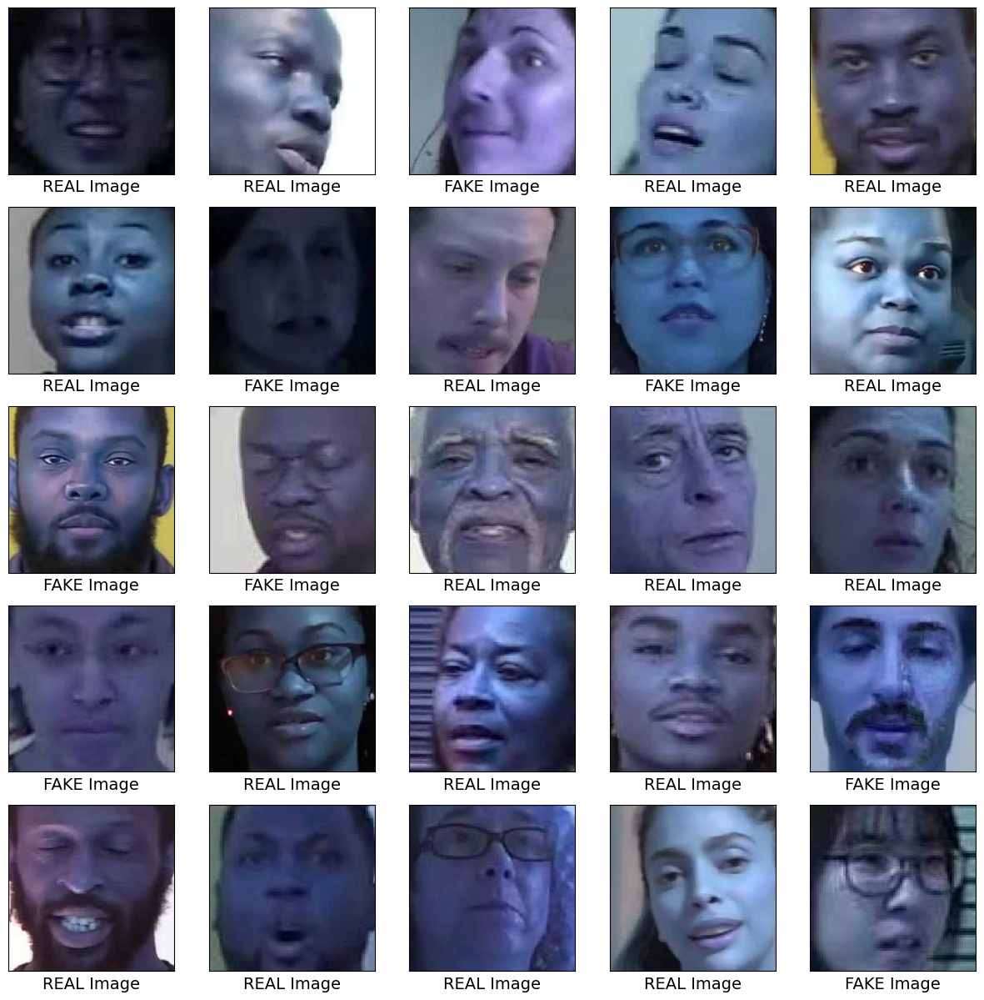

In [16]:
plt.figure(figsize=(15,15))
for cur,i in enumerate(Train_set.index[25:50]):
    plt.subplot(5,5,cur+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    
    plt.imshow(cv2.imread('../input/deepfake-faces/faces_224/'+Train_set.loc[i,'videoname'][:-4]+'.jpg'))
    
    if(Train_set.loc[i,'label']=='FAKE'):
        plt.xlabel('FAKE Image')
    else:
        plt.xlabel('REAL Image')
        
plt.show()

## Modelling

Before jumping to use pretrained model lets develop some base line model to test how our pretrained model outperforms.

### Custom CNN Architecture

In [17]:
def retreive_dataset(set_name):
    images,labels=[],[]
    for (img, imclass) in zip(set_name['videoname'], set_name['label']):
        images.append(cv2.imread('../input/deepfake-faces/faces_224/'+img[:-4]+'.jpg'))
        if(imclass=='FAKE'):
            labels.append(1)
        else:
            labels.append(0)
    
    return np.array(images),np.array(labels)

In [18]:
X_train,y_train=retreive_dataset(Train_set)
X_val,y_val=retreive_dataset(Val_set)
X_test,y_test=retreive_dataset(Test_set)

In [21]:
from functools import partial
import tensorflow as tf

tf.random.set_seed(42)

DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, padding="same",
                        activation="relu", kernel_initializer="he_normal")

model = tf.keras.Sequential([
    tf.keras.Input(shape=[224, 224, 3]),  # Use Input layer instead of passing input_shape
    DefaultConv2D(filters=64, kernel_size=7),
    tf.keras.layers.MaxPool2D(),
    DefaultConv2D(filters=128),
    DefaultConv2D(filters=128),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=64, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=1, activation="sigmoid")
])

In [22]:
model.compile(loss="binary_crossentropy", optimizer="nadam",
              metrics=["accuracy"])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 64)   │         9,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 401408)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │    51,380,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,619,585 (196.91 MB)

 Trainable params: 51,619,585 (196.91 MB)

 Non-trainable params: 0 (0.00 B)

In [23]:
history = model.fit(X_train, y_train, epochs=5,batch_size=64,
                    validation_data=(X_val, y_val))

Epoch 1/5


I0000 00:00:1714107943.138019     134 service.cc:145] XLA service 0x7f0b70006cc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1714107943.138075     134 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1714107943.138080     134 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1714107973.166474     134 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


140/140 ━━━━━━━━━━━━━━━━━━━━ 73s 290ms/step - accuracy: 0.5101 - loss: 406.2789 - val_accuracy: 0.4839 - val_loss: 0.7148
Epoch 2/5
140/140 ━━━━━━━━━━━━━━━━━━━━ 39s 280ms/step - accuracy: 0.5071 - loss: 0.6958 - val_accuracy: 0.5005 - val_loss: 0.6942
Epoch 3/5
140/140 ━━━━━━━━━━━━━━━━━━━━ 39s 278ms/step - accuracy: 0.5019 - loss: 0.6949 - val_accuracy: 0.5003 - val_loss: 0.6934
Epoch 4/5
140/140 ━━━━━━━━━━━━━━━━━━━━ 39s 279ms/step - accuracy: 0.4992 - loss: 0.6929 - val_accuracy: 0.5000 - val_loss: 0.6927
Epoch 5/5
140/140 ━━━━━━━━━━━━━━━━━━━━ 39s 279ms/step - accuracy: 0.5158 - loss: 0.6933 - val_accuracy: 0.5018 - val_loss: 0.6935


In [24]:
score = model.evaluate(X_test, y_test)

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - accuracy: 0.4890 - loss: 0.6934


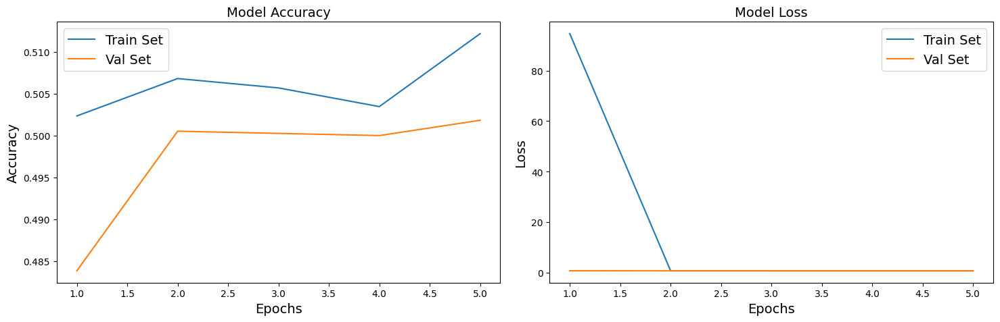

In [25]:
# plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

A baseline score of 50.06% is good to go let's finetune some pretrained model

# Pretrained Models for Transfer Learning

Here we have used Xception model for fine-tuning feel free to try the performance of other pretrained models.

All three datasets contain individual images. We need to batch them, but for this we first need to ensure they all have the same size, or else batching will not work. We can use a `Resizing` layer for this. We must also call the `tf.keras.applications.xception.preprocess_input()` function to preprocess the images appropriately for the Xception model. We will also add shuffling and prefetching to the training dataset.

In [26]:
train_set_raw=tf.data.Dataset.from_tensor_slices((X_train,y_train))
valid_set_raw=tf.data.Dataset.from_tensor_slices((X_val,y_val))
test_set_raw=tf.data.Dataset.from_tensor_slices((X_test,y_test))

In [27]:
tf.keras.backend.clear_session()  # extra code – resets layer name counter

batch_size = 32
preprocess = tf.keras.applications.xception.preprocess_input
train_set = train_set_raw.map(lambda X, y: (preprocess(tf.cast(X, tf.float32)), y))
train_set = train_set.shuffle(1000, seed=42).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(lambda X, y: (preprocess(tf.cast(X, tf.float32)), y)).batch(batch_size)
test_set = test_set_raw.map(lambda X, y: (preprocess(tf.cast(X, tf.float32)), y)).batch(batch_size)

Let's take a look again at the first 9 images from the validation set: they're all with values ranging from -1 to 1:

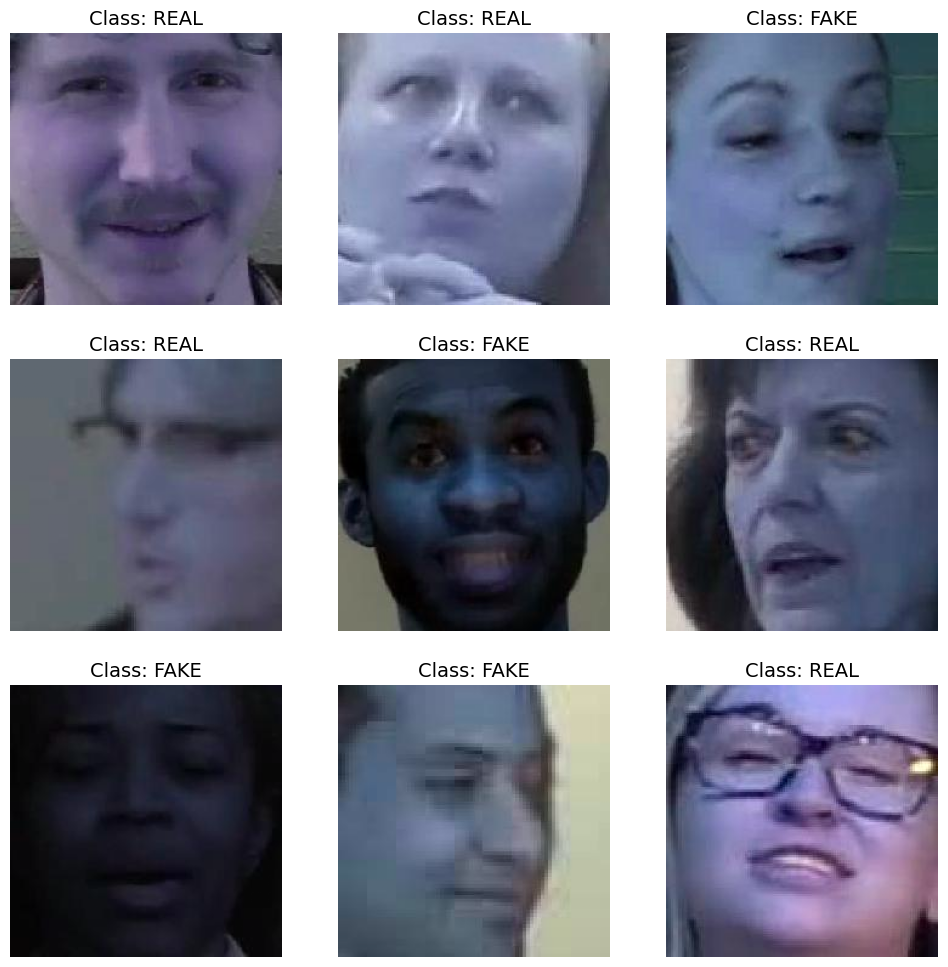

In [28]:
# extra code – displays the first 9 images in the first batch of valid_set

plt.figure(figsize=(12, 12))
for X_batch, y_batch in valid_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow((X_batch[index] + 1) / 2)  # rescale to 0–1 for imshow()
        if(y_batch[index]==1):
            classt='FAKE'
        else:
            classt='REAL'
        plt.title(f"Class: {classt}")
        plt.axis("off")

plt.show()

In [31]:
import tensorflow as tf

def random_flip(image, seed=None):
    if seed is not None:
        tf.random.set_seed(seed)
    return tf.image.random_flip_left_right(image)

def random_rotation(image, factor=0.05, seed=None):
    if seed is not None:
        tf.random.set_seed(seed)
    return tf.keras.layers.experimental.preprocessing.RandomRotation(factor=factor)(image)

def random_contrast(image, factor=0.2, seed=None):
    if seed is not None:
        tf.random.set_seed(seed)
    return tf.keras.layers.experimental.preprocessing.RandomContrast(factor=factor)(image)

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.Lambda(lambda x: random_flip(x, seed=42)),
    tf.keras.layers.Lambda(lambda x: random_rotation(x, factor=0.05, seed=42)),
    tf.keras.layers.Lambda(lambda x: random_contrast(x, factor=0.2, seed=42))
])


Try running the following cell multiple times to see different random data augmentations:

Now let's load the pretrained model, without its top layers, and replace them with our own task

In [33]:
tf.random.set_seed(42)  # extra code – ensures reproducibility
base_model = tf.keras.applications.xception.Xception(weights="imagenet",
                                                     include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(1, activation="sigmoid")(avg)
model = tf.keras.Model(inputs=base_model.input, outputs=output)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [34]:
for layer in base_model.layers:
    layer.trainable = False

Let's train the model for a few epochs, while keeping the base model weights fixed:

In [35]:
#train the model for a few epochs, while keeping the base model weights fixed
optimizer = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9)
model.compile(loss="binary_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set, validation_data=valid_set, epochs=3)

Epoch 1/3
280/280 ━━━━━━━━━━━━━━━━━━━━ 67s 185ms/step - accuracy: 0.5701 - loss: 0.9087 - val_accuracy: 0.5659 - val_loss: 1.4576
Epoch 2/3
280/280 ━━━━━━━━━━━━━━━━━━━━ 49s 173ms/step - accuracy: 0.5962 - loss: 1.0578 - val_accuracy: 0.6409 - val_loss: 0.7502
Epoch 3/3
280/280 ━━━━━━━━━━━━━━━━━━━━ 48s 173ms/step - accuracy: 0.6236 - loss: 0.9111 - val_accuracy: 0.6120 - val_loss: 0.9380


In [36]:
for indices in zip(range(33), range(33, 66), range(66, 99), range(99, 132)):
    for idx in indices:
        print(f"{idx:3}: {base_model.layers[idx].name:22}", end="")
    print()

  0: input_layer_2          33: block4_pool            66: block8_sepconv1_act    99: block11_sepconv2_act  
  1: block1_conv1           34: batch_normalization_2  67: block8_sepconv1       100: block11_sepconv2      
  2: block1_conv1_bn        35: add_2                  68: block8_sepconv1_bn    101: block11_sepconv2_bn   
  3: block1_conv1_act       36: block5_sepconv1_act    69: block8_sepconv2_act   102: block11_sepconv3_act  
  4: block1_conv2           37: block5_sepconv1        70: block8_sepconv2       103: block11_sepconv3      
  5: block1_conv2_bn        38: block5_sepconv1_bn     71: block8_sepconv2_bn    104: block11_sepconv3_bn   
  6: block1_conv2_act       39: block5_sepconv2_act    72: block8_sepconv3_act   105: add_9                 
  7: block2_sepconv1        40: block5_sepconv2        73: block8_sepconv3       106: block12_sepconv1_act  
  8: block2_sepconv1_bn     41: block5_sepconv2_bn     74: block8_sepconv3_bn    107: block12_sepconv1      
  9: block2_sepconv

In [37]:
model.evaluate(test_set)

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - accuracy: 0.6290 - loss: 0.9084


[0.9449967741966248, 0.6175000071525574]

Now with the finetuning the top layers of xception model the model performance jumps to 63.8% 

Now that the weights of our new top layers are not too bad, we can make the top part of the base model trainable again, and continue training, but with a lower learning rate:

In [38]:
for layer in base_model.layers[56:]:
    layer.trainable = True

optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
model.compile(loss="binary_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set, validation_data=valid_set, epochs=10)

Epoch 1/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 110s 328ms/step - accuracy: 0.6250 - loss: 0.6735 - val_accuracy: 0.7453 - val_loss: 0.5076
Epoch 2/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 318ms/step - accuracy: 0.8433 - loss: 0.3485 - val_accuracy: 0.7648 - val_loss: 0.5609
Epoch 3/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 319ms/step - accuracy: 0.9285 - loss: 0.1800 - val_accuracy: 0.7688 - val_loss: 0.7605
Epoch 4/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 317ms/step - accuracy: 0.9577 - loss: 0.1167 - val_accuracy: 0.7870 - val_loss: 0.6945
Epoch 5/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 317ms/step - accuracy: 0.9703 - loss: 0.0738 - val_accuracy: 0.7937 - val_loss: 0.7716
Epoch 6/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 317ms/step - accuracy: 0.9813 - loss: 0.0548 - val_accuracy: 0.7326 - val_loss: 1.1234
Epoch 7/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 318ms/step - accuracy: 0.9832 - loss: 0.0459 - val_accuracy: 0.7857 - val_loss: 0.7711
Epoch 8/10
280/280 ━━━━━━━━━━━━━━━━━━━━ 89s 318ms/step - accuracy: 0.9859 - loss: 

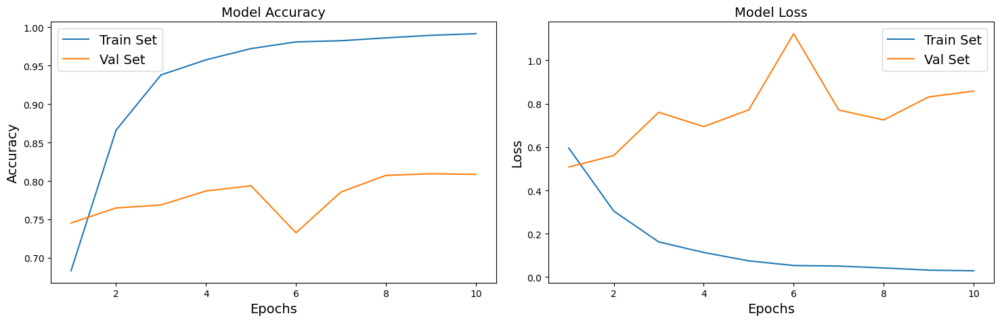

In [39]:
# plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

In [40]:
model.evaluate(test_set)

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - accuracy: 0.8088 - loss: 0.7977


[0.7824663519859314, 0.815625011920929]

The model accuracy finally reaches to 81.9%

In [41]:
model.save('xception_deepfake_image.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Classification Value -: 0.69449776


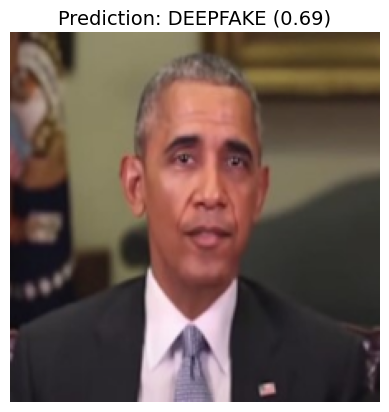

In [56]:
import numpy as np
import cv2
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Load the model
model = load_model('/kaggle/working/xception_deepfake_image.h5')

# Load and preprocess your input data
image_path = '/kaggle/input/videos/Obama_fake.jpg'

# Load the image
image = cv2.imread(image_path)

# Check if image loading was successful
if image is None:
    print(f"Error: Unable to load image from path '{image_path}'")
    exit()

# Resize the image to match the input size of your model
input_size = (224, 224)
resized_image = cv2.resize(image, input_size)

# Normalize the resized image
normalized_image = resized_image / 255.0

# Add a batch dimension
input_image = np.expand_dims(normalized_image, axis=0)

# Make predictions using the loaded model
predictions = model.predict(input_image)

# Interpret the predictions
prediction_value = predictions[0][0]  # Assuming predictions are for a single image (batch size of 1)
print("Classification Value -:",prediction_value)
threshold = 0.5  # Threshold for binary classification (adjust as needed)

# Determine the classification label and confidence
if prediction_value >= threshold:
    classification_label = "DEEPFAKE"
    confidence = prediction_value
else:
    classification_label = "REAL"
    confidence = 1 - prediction_value

# Display the image with classification label using matplotlib
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title(f"Prediction: {classification_label} ({confidence:.2f})")
plt.axis('off')  # Turn off axis
plt.show()

# Add Explainability to the model

Lets try to interpret the trained model on how it finds a image FAKE

In [ ]:
!pip install lime

In [ ]:
from lime import lime_image

explainer = lime_image.LimeImageExplainer()

In [ ]:
plt.figure(figsize=(12, 12))

for index in range(9):
    plt.subplot(3, 3, index + 1)
    plt.imshow((x[index] + 1) / 2)  # rescale to 0–1 for imshow()
    if(y[index]==1):
        classt='FAKE'
    else:
        classt='REAL'
    plt.title(f"Class: {classt}")
    plt.axis("off")

plt.show()

In [ ]:
test_data=x[2,:,:,:]
test_data.shape

In [ ]:
explanation = explainer.explain_instance(test_data.astype('double'), model.predict,  
                                         top_labels=3, hide_color=0, num_samples=1000)

In [ ]:
from skimage.segmentation import mark_boundaries

temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

# Deep Fake Video Classification

## About the dataset

Files

* train_sample_videos.zip - a ZIP file containing a sample set of training videos and a metadata.json with labels. the full set of training videos is available through the links provided above.
* sample_submission.csv - a sample submission file in the correct format.
* test_videos.zip - a zip file containing a small set of videos to be used as a public validation set. To understand the datasets available for this competition, review the Getting Started information.

Metadata Columns

* filename - the filename of the video
* label - whether the video is REAL or FAKE
* original - in the case that a train set video is FAKE, the original video is listed here
* split - this is always equal to "train".

## Importing required libraries

In [2]:
!pip install -U --upgrade tensorflow

     |████████████████████████████████| 458.3MB 27kB/s s eta 0:00:01
     |████████████████████████████████| 5.6MB 43.6MB/s eta 0:00:01
     |████████████████████████████████| 71kB 4.8MB/s  eta 0:00:01
     |████████████████████████████████| 51kB 582kB/s  eta 0:00:01
     |████████████████████████████████| 61kB 634kB/s  eta 0:00:01
     |████████████████████████████████| 14.8MB 120kB/s  eta 0:00:01
     |████████████████████████████████| 4.0MB 40.9MB/s eta 0:00:01
     |████████████████████████████████| 4.6MB 35.5MB/s eta 0:00:01
     |████████████████████████████████| 1.3MB 35.7MB/s eta 0:00:01
     |████████████████████████████████| 471kB 41.5MB/s eta 0:00:01
     |████████████████████████████████| 133kB 45.0MB/s eta 0:00:01
     |████████████████████████████████| 4.9MB 35.5MB/s eta 0:00:01
     |████████████████████████████████| 788kB 47.1MB/s eta 0:00:01
  Created wheel for clang: filename=clang-5.0-cp36-none-any.whl size=30705 sha256=2dfd69374e4b05ce223cfbf67ea14a93956a48dca9d6ab4

In [3]:
# from tensorflow_docs.vis import embed
from tensorflow import keras
#from imutils import paths

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

2024-04-24 14:37:35.436104: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-24 14:37:35.436205: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-24 14:37:35.565106: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [7]:
tf.__version__

'2.15.0'

In [8]:
tf.test.is_gpu_available()

True

## Data Visualisation

In [9]:
DATA_FOLDER = '../input/deepfake-detection-challenge'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
TEST_FOLDER = 'test_videos'

print(f"Train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"Test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

Train samples: 401
Test samples: 400


In [10]:
train_sample_metadata = pd.read_json('../input/deepfake-detection-challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


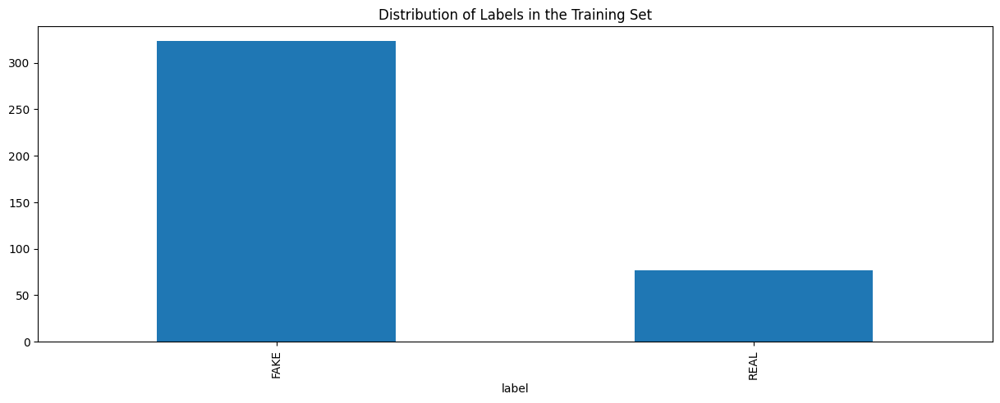

In [11]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

In [12]:
train_sample_metadata.shape

(400, 3)

Let's visualize now the data.

We select first a list of fake videos.

### Few fake videos

In [13]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(3).index)
fake_train_sample_video

['dxuliowugt.mp4', 'aknmpoonls.mp4', 'dlrsbscitn.mp4']

In [14]:
def display_image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_image = cv2.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

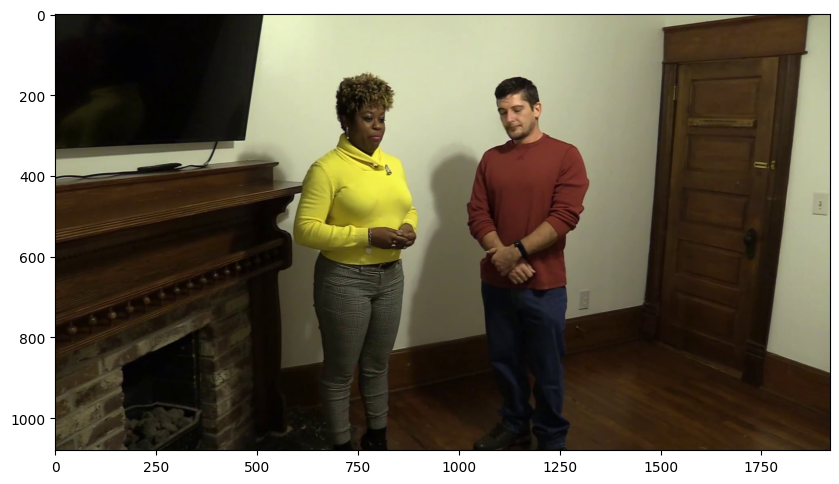

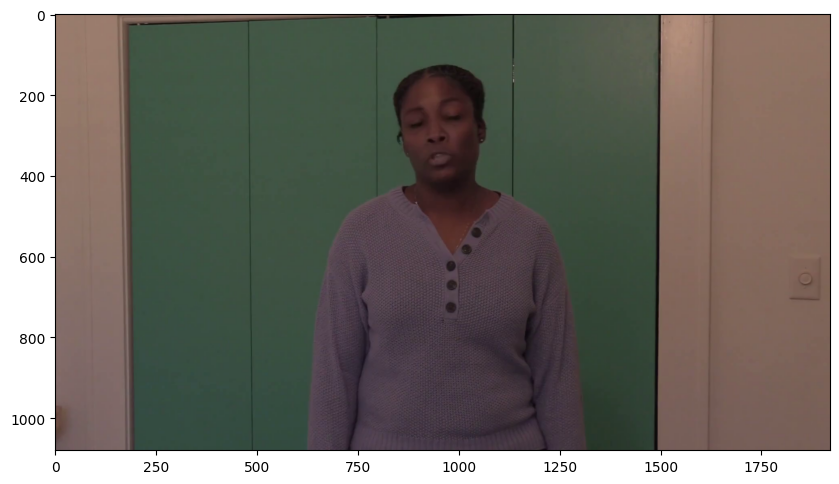

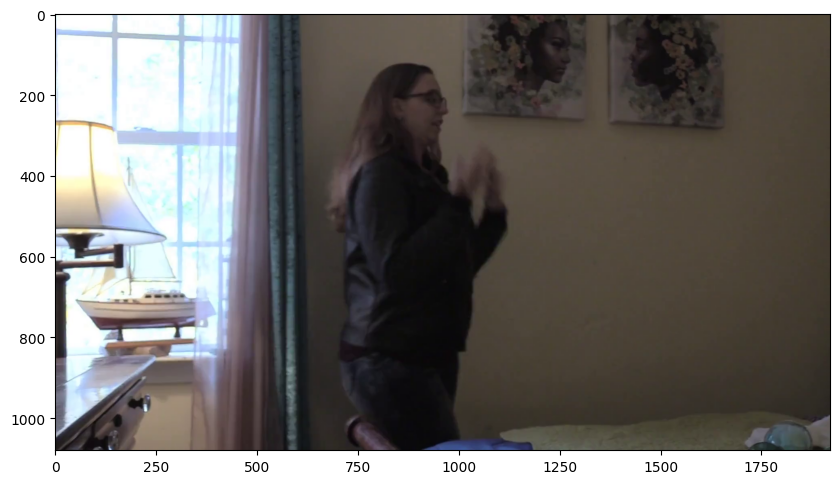

In [15]:
for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

Let's try now the same for few of the images that are real.

### Few Real Videos

In [16]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(3).index)
real_train_sample_video

['crezycjqyk.mp4', 'chviwxsfhg.mp4', 'drcyabprvt.mp4']

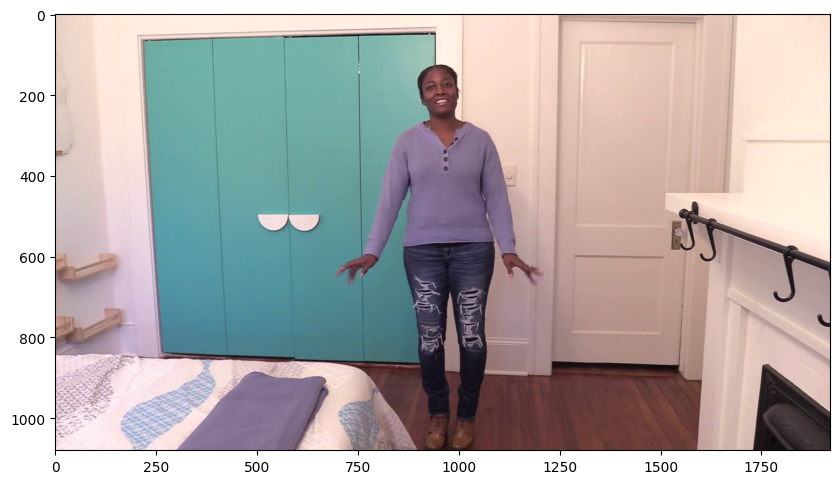

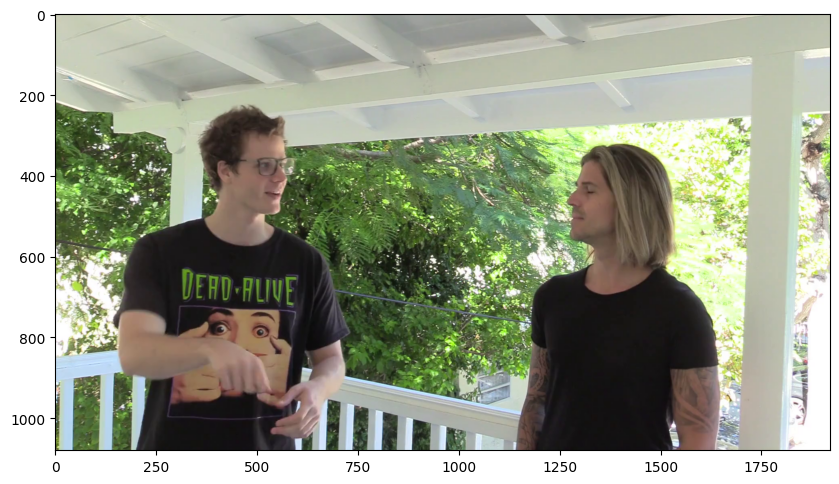

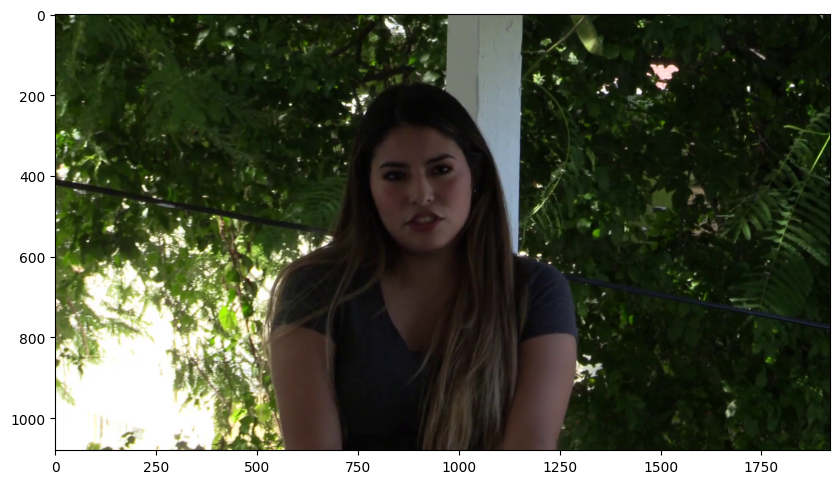

In [17]:
for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

### Videos with same original

Let's look now to set of samples with the same original.

In [18]:
train_sample_metadata['original'].value_counts()[0:5]

original
atvmxvwyns.mp4    6
meawmsgiti.mp4    6
qeumxirsme.mp4    5
kgbkktcjxf.mp4    5
dzyuwjkjui.mp4    4
Name: count, dtype: int64

We pick one of the originals with largest number of samples.

We also modify our visualization function to work with multiple images.

In [19]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    '''
    input: video_path_list - path for video
    process:
    0. for each video in the video path list
        1. perform a video capture from the video
        2. read the image
        3. display the image
    '''
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    # we only show images extracted from the first 6 videos
    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(DATA_FOLDER, video_folder,video_file)
        capture_image = cv2.VideoCapture(video_path) 
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')


<Figure size 640x480 with 0 Axes>

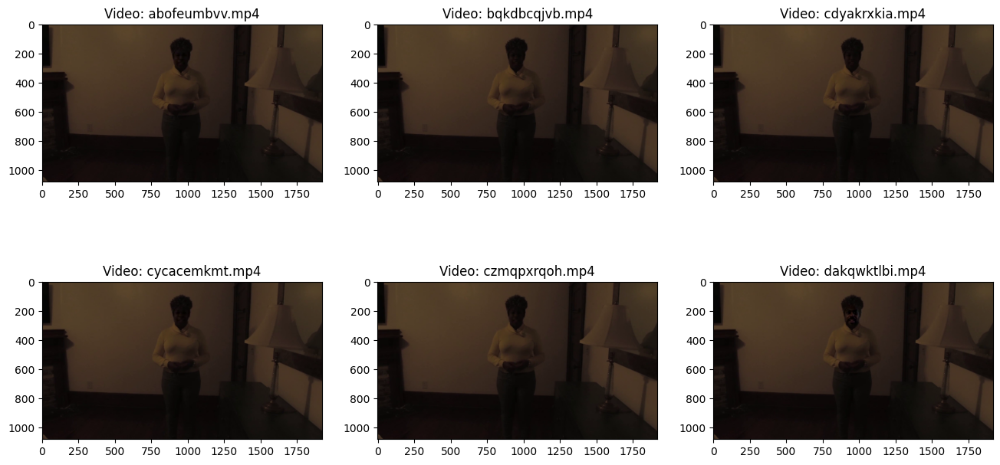

In [20]:
same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='atvmxvwyns.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

### Test video files

Let's also look to few of the test data files.

In [21]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [22]:
test_videos.head()

,video
0,qooxnxqqjb.mp4
1,hierggamuo.mp4
2,ocgdbrgmtq.mp4
3,icbsahlivv.mp4
4,prhmixykhr.mp4


Let's visualize now one of the videos.

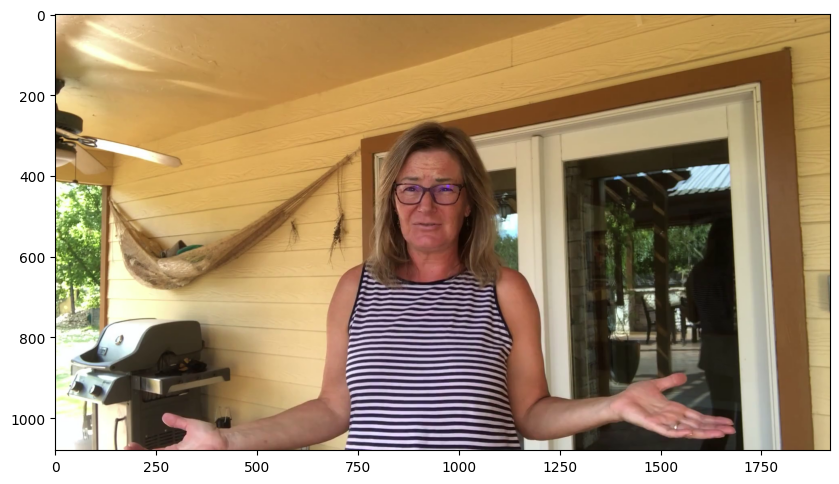

In [23]:
display_image_from_video(os.path.join(DATA_FOLDER, TEST_FOLDER, test_videos.iloc[2].video))

### Play video files

Let's look to few fake videos.

In [24]:
fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [25]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join(DATA_FOLDER, subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

play_video(fake_videos[10])

From visual inspection of these fakes videos, in some cases is very easy to spot the anomalies created when engineering the deep fake, in some cases is more difficult.

## Modelling

### A CNN-RNN Architecture

In [26]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 10

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

 In this example we will do the following:

* Capture the frames of a video.
* Extract frames from the videos until a maximum frame count is reached.
* In the case, where a video's frame count is lesser than the maximum frame count we will pad the video with zeros.

In [27]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]


def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

We can use a pre-trained network to extract meaningful features from the extracted frames. The Keras Applications module provides a number of state-of-the-art models pre-trained on the ImageNet-1k dataset. We will be using the InceptionV3 model for this purpose.

In [28]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")


feature_extractor = build_feature_extractor()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Finally, we can put all the pieces together to create our data processing utility.

In [35]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(int)

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

Since we don't have test labels we split the training data to find its performance in unseen data

In [36]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(train_sample_metadata,test_size=0.1,random_state=42,stratify=train_sample_metadata['label'])

print(Train_set.shape, Test_set.shape )

(360, 3) (40, 3)


In [37]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (360, 20, 2048)
Frame masks in train set: (360, 20)


## The sequence model

Now, we can feed this data to a sequence model consisting of recurrent layers like GRU.

In [38]:
frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

# Refer to the following tutorial to understand the significance of using `mask`:
# https://keras.io/api/layers/recurrent_layers/gru/
x = keras.layers.GRU(16, return_sequences=True)(
    frame_features_input, mask=mask_input
)
x = keras.layers.GRU(8)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 20, 2048)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_5       │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_2 (GRU)         │ (None, 20, 16)    │     99,168 │ input_layer_4[0]… │
│                     │                   │            │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_3 (GRU)         │ (None, 8)         │        624 │ gru_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 8)         │          0 │ gru_3[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 8)         │         72 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1)         │          9 │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 99,873 (390.13 KB)

 Trainable params: 99,873 (390.13 KB)

 Non-trainable params: 0 (0.00 B)

In [40]:
checkpoint = keras.callbacks.ModelCheckpoint('./model_weights.weights.h5', save_weights_only=True, save_best_only=True)
history = model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_data=([test_data[0], test_data[1]],test_labels),
        callbacks=[checkpoint],
        epochs=EPOCHS,
        batch_size=8
    )

Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.7237 - loss: 0.6900 - val_accuracy: 0.8000 - val_loss: 0.6811
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7933 - loss: 0.6784 - val_accuracy: 0.8000 - val_loss: 0.6696
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7992 - loss: 0.6668 - val_accuracy: 0.8000 - val_loss: 0.6586
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8377 - loss: 0.6513 - val_accuracy: 0.8000 - val_loss: 0.6483
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8124 - loss: 0.6439 - val_accuracy: 0.8000 - val_loss: 0.6388
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8244 - loss: 0.6314 - val_accuracy: 0.8000 - val_loss: 0.6296
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8399 - loss: 0.6178 - val_accuracy: 0.8000 - val_loss: 0.6210
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7627 - loss: 0.6293 - val_accuracy: 0.8000 - v

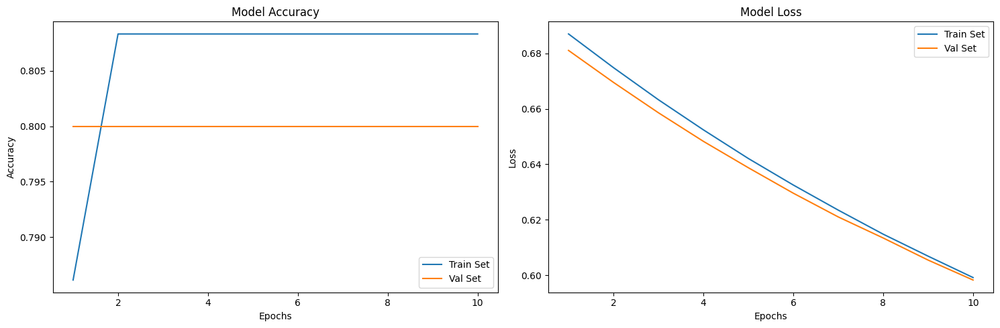

In [42]:
# plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

In [55]:
# model.evaluate(Test_set)
print(Test_set)

               label  split        original
eukvucdetx.mp4  FAKE  train  gjypopglvi.mp4
cxfujlvsuw.mp4  FAKE  train  qtnjyomzwo.mp4
brhalypwoo.mp4  FAKE  train  uuxqylnzls.mp4
ecuvtoltue.mp4  FAKE  train  xngpzquyhs.mp4
avfitoutyn.mp4  FAKE  train  mfzqxktxud.mp4
ccmonzqfrz.mp4  FAKE  train  gxhcuxulhi.mp4
bmioepcpsx.mp4  FAKE  train  vmospzljws.mp4
avssvvsdhz.mp4  FAKE  train  gktjowiuqe.mp4
bmbbkwmxqj.mp4  FAKE  train  rrcsuwgpnd.mp4
ajwpjhrbcv.mp4  FAKE  train  bzythlfnhq.mp4
coadfnerlk.mp4  FAKE  train  bwipwzzxxu.mp4
asvcrfdpnq.mp4  FAKE  train  upgerjvcjb.mp4
crktehraph.mp4  FAKE  train  vrsinxahfh.mp4
aipfdnwpoo.mp4  FAKE  train  ygdgwyqyut.mp4
eivxffliio.mp4  FAKE  train  joeifeskbs.mp4
eqjscdagiv.mp4  FAKE  train  dbnygxtwek.mp4
dsndhujjjb.mp4  FAKE  train  ohnonevlro.mp4
cglxirfaey.mp4  FAKE  train  qypgyrxcme.mp4
bhaaboftbc.mp4  FAKE  train  rlvgtsjyer.mp4
cdbsbdymzd.mp4  FAKE  train  xngpzquyhs.mp4
cwwandrkus.mp4  FAKE  train  kgbkktcjxf.mp4
atyntldecu.mp4  FAKE  train  mfz

In [2]:
model.save('cnn_deepfake_video.h5')

NameError: name 'model' is not defined

### Inference

In [ ]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]
    
# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


# test_video = np.random.choice(test_videos["video"].values.tolist())
test_video = '/kaggle/input/demodatavideo/Real_Demo.mp4'

print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(sequence_prediction(test_video))
    print(f'The predicted class of the video is FAKE')
else:
    print(sequence_prediction(test_video))
    print(f'The predicted class of the video is REAL')

play_video(test_video,TEST_FOLDER)

Test video path: /kaggle/input/demodatavideo/Real_Demo.mp4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 2

Here we used simple RNN model feel free to try some complex Attention based and Transformer based models

# Conclusion

The deep fake image classifier and deep fake video classifier model gave a generalisation error of around 80%

# Reference and Thanks to 

https://keras.io/examples/vision/video_classification/

https://www.kaggle.com/code/gpreda/deepfake-starter-kit

https://www.kaggle.com/code/robikscube/kaggle-deepfake-detection-introduction